In [1]:
import os
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from patchify import patchify, unpatchify
import seaborn as sns
import random
import numpy as np
import math
from sklearn.model_selection import train_test_split
from skimage.metrics import peak_signal_noise_ratio as psnr
import pickle
import tensorflow as tf

2023-10-30 12:23:52.571212: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


# Importing Dataset

### Extracting image paths for SSID dataset

In [4]:
dir = os.listdir('datasets/SIDD_Small_sRGB_Only/Data')

folders = []
GT = []
Noisy = []

for folder in dir:
    folders.append(folder)

for folder in folders:
    files = os.listdir('datasets/SIDD_Small_sRGB_Only/Data/' + folder)
    for image in files:
        if image[5] == 'G':
            GT.append('datasets/SIDD_Small_sRGB_Only/Data/' + folder + '/' + image)
        else:
            Noisy.append('datasets/SIDD_Small_sRGB_Only/Data/' + folder + '/' + image)

### Extracting image paths for RENOIR dataset

In [52]:
dir = os.listdir('datasets/Mi3_Aligned')

folders = []
GT = []
Noisy = []

for folder in dir:
    folders.append(folder)

for folder in folders:
    added = False

    if folder == '.DS_Store':
        continue

    files = os.listdir('datasets/Mi3_Aligned/' + folder)

    for image in files:
        if 'Reference.bmp' in image:
            GT.append('datasets/Mi3_Aligned/' + folder + '/' + image)
        
        if 'Noisy.bmp' in image and not added:
            Noisy.append('datasets/Mi3_Aligned/' + folder + '/' + image)
            added = True

In [5]:
df = pd.DataFrame()
df['Ground Truth Images'] = GT
df['Noisy Images'] = Noisy
df.head()

,Ground Truth Images,Noisy Images
0,datasets/SIDD_Small_sRGB_Only/Data/0140_006_IP...,datasets/SIDD_Small_sRGB_Only/Data/0140_006_IP...
1,datasets/SIDD_Small_sRGB_Only/Data/0039_002_IP...,datasets/SIDD_Small_sRGB_Only/Data/0039_002_IP...
2,datasets/SIDD_Small_sRGB_Only/Data/0097_005_N6...,datasets/SIDD_Small_sRGB_Only/Data/0097_005_N6...
3,datasets/SIDD_Small_sRGB_Only/Data/0010_001_S6...,datasets/SIDD_Small_sRGB_Only/Data/0010_001_S6...
4,datasets/SIDD_Small_sRGB_Only/Data/0196_009_IP...,datasets/SIDD_Small_sRGB_Only/Data/0196_009_IP...


In [5]:
df.shape

(160, 2)

 # Exploratory Data Analysis

### Image Sizes

In [6]:
size = []
for i in range(len(df)):
    img_gt = cv2.imread(df['Ground Truth Images'].iloc[i])
    size.append(img_gt.shape)

In [7]:
df['image size'] = size
df['image size'] = df['image size'].astype(str)
df.head()

,Ground Truth Images,Noisy Images,image size
0,datasets/SIDD_Small_sRGB_Only/Data/0140_006_IP...,datasets/SIDD_Small_sRGB_Only/Data/0140_006_IP...,"(3024, 4032, 3)"
1,datasets/SIDD_Small_sRGB_Only/Data/0039_002_IP...,datasets/SIDD_Small_sRGB_Only/Data/0039_002_IP...,"(3024, 4032, 3)"
2,datasets/SIDD_Small_sRGB_Only/Data/0097_005_N6...,datasets/SIDD_Small_sRGB_Only/Data/0097_005_N6...,"(3120, 4208, 3)"
3,datasets/SIDD_Small_sRGB_Only/Data/0010_001_S6...,datasets/SIDD_Small_sRGB_Only/Data/0010_001_S6...,"(3000, 5328, 3)"
4,datasets/SIDD_Small_sRGB_Only/Data/0196_009_IP...,datasets/SIDD_Small_sRGB_Only/Data/0196_009_IP...,"(3024, 4032, 3)"


Text(0, 0.5, 'Number of Images')

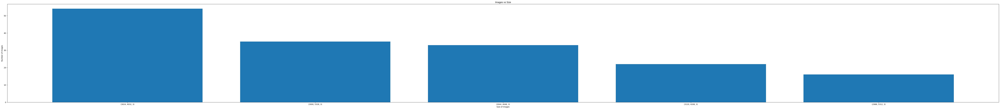

In [8]:
fig = plt.figure(figsize=(100, 10))
y = list(df['image size'].value_counts())
x = df['image size'].value_counts().index.to_list()
plt.bar(x, y)
plt.title("Images vs Size")
plt.xlabel("Size of Images")
plt.ylabel("Number of Images")

### Displaying few clean-noisy image pairs

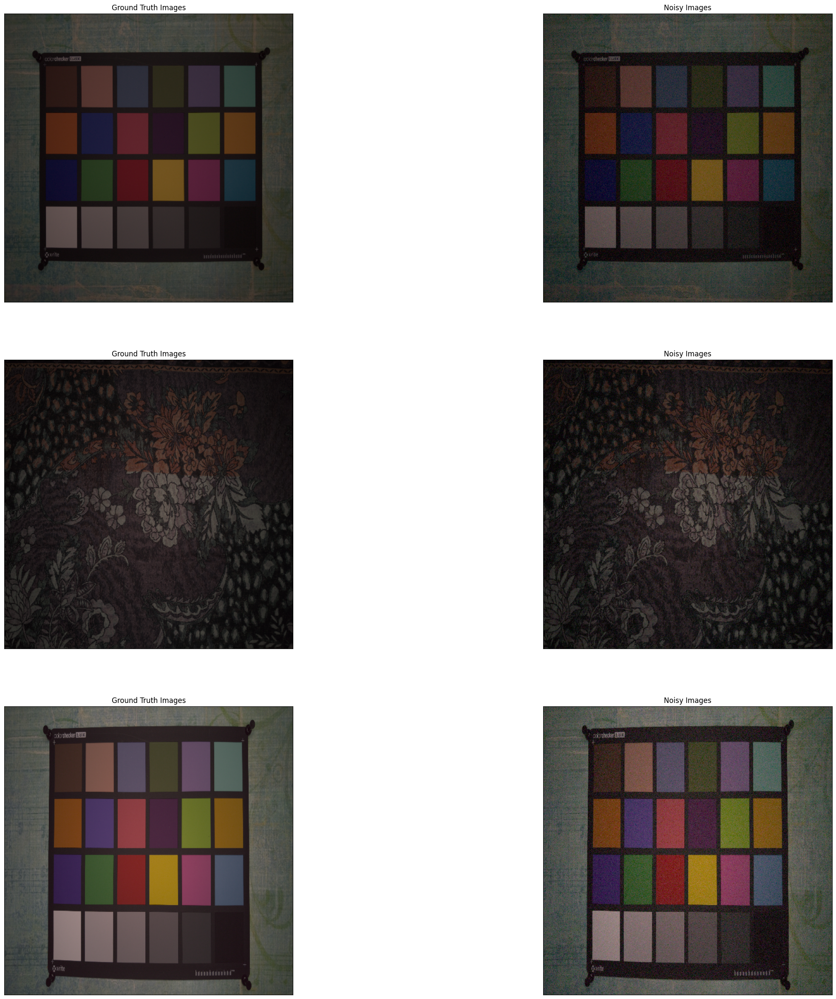

In [9]:
sample = df.sample(3)
fig, ax = plt.subplots(len(sample), 2, figsize=(30, 30))
for i in range(len(sample)):
    img = cv2.imread(sample['Ground Truth Images'].iloc[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (512, 512))
    ax[i][0].imshow(img)
    ax[i][0].get_xaxis().set_visible(False)
    ax[i][0].get_yaxis().set_visible(False)
    ax[i][0].title.set_text("Ground Truth Images")

    img = cv2.imread(sample['Noisy Images'].iloc[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (512, 512))
    ax[i][1].imshow(img)
    ax[i][1].get_xaxis().set_visible(False)
    ax[i][1].get_yaxis().set_visible(False)
    ax[i][1].title.set_text("Noisy Images")

### Splitting the dataset into test and train

In [10]:
X = df['Noisy Images']
y = df['Ground Truth Images']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [11]:
# storing the image patches as pickle files
pickle.dump((X_train, y_train), open('train_path.pkl', 'wb'))
pickle.dump((X_test, y_test), open('test_path.pkl', 'wb'))

In [12]:
X_train, y_train = pickle.load(open('train_path.pkl', "rb"))
X_test, y_test = pickle.load(open('test_path.pkl', 'rb'))

In [13]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(128,)
(128,)
(32,)
(32,)


### Creating Patches

In [14]:
def patches(img, patch_size):
    patches = patchify(img, (patch_size, patch_size, 3), step=patch_size)
    return patches

In [15]:
X_train_patches = []
y_train_patches = []

for i in range(len(X_train)):
    path = X_train.iloc[i]
    img_nsy = cv2.imread(path)
    img_nsy = cv2.cvtColor(img_nsy, cv2.COLOR_BGR2RGB)
    img_nsy = cv2.resize(img_nsy, (1024, 1024))
    patches_nsy = patches(img_nsy, 256)

    path = X_train.iloc[i]
    img_gt = cv2.imread(path)
    img_gt = cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB)
    img_gt = cv2.resize(img_gt, (1024, 1024))
    patches_gt = patches(img_gt, 256)

    rows = patches_nsy.shape[0]
    cols = patches_nsy.shape[1]

    for j in range(rows):
        for k in range(cols):
            X_train_patches.append(patches_nsy[j][k][0])
            y_train_patches.append(patches_gt[j][k][0])

X_train = np.array(X_train_patches)
y_train = np.array(y_train_patches)

In [16]:
X_test_patches = []
y_test_patches = []

for i in range(len(X_test)):
    path = X_test.iloc[i]
    img_nsy = cv2.imread(path)
    img_nsy = cv2.cvtColor(img_nsy, cv2.COLOR_BGR2RGB)
    img_nsy = cv2.resize(img_nsy,(1024,1024))  #resizing the X_test images
    patches_nsy = patches(img_nsy,256)

    path = y_test.iloc[i]
    img_gt = cv2.imread(path)
    img_gt = cv2.cvtColor(img_gt, cv2.COLOR_BGR2RGB)
    img_gt = cv2.resize(img_gt,(1024,1024))  #resizing the y_test images
    patches_gt = patches(img_gt,256)

    rows = patches_nsy.shape[0]
    cols = patches_nsy.shape[1]

    for j in range(rows):
        for k in range(cols):
            X_test_patches.append(patches_nsy[j][k][0])
            y_test_patches.append(patches_gt[j][k][0])

X_test = np.array(X_test_patches)
y_test = np.array(y_test_patches)

In [17]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(2048, 256, 256, 3)
(2048, 256, 256, 3)
(512, 256, 256, 3)
(512, 256, 256, 3)


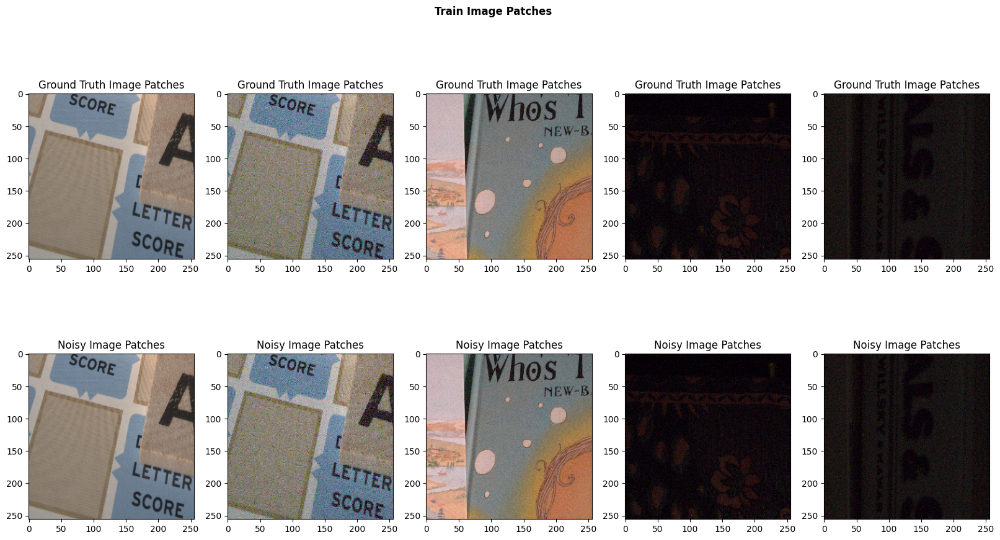

In [18]:
fig, axs = plt.subplots(2,5,figsize=(20,10))
r = random.sample(range(0, 2048), 5)

fig.suptitle('Train Image Patches',fontweight ="bold")
for i in range(5):
    axs[0][i].imshow(y_train[r[i]])
    axs[0][i].set_title('Ground Truth Image Patches')
    axs[1][i].imshow(X_train[r[i]])
    axs[1][i].set_title('Noisy Image Patches')

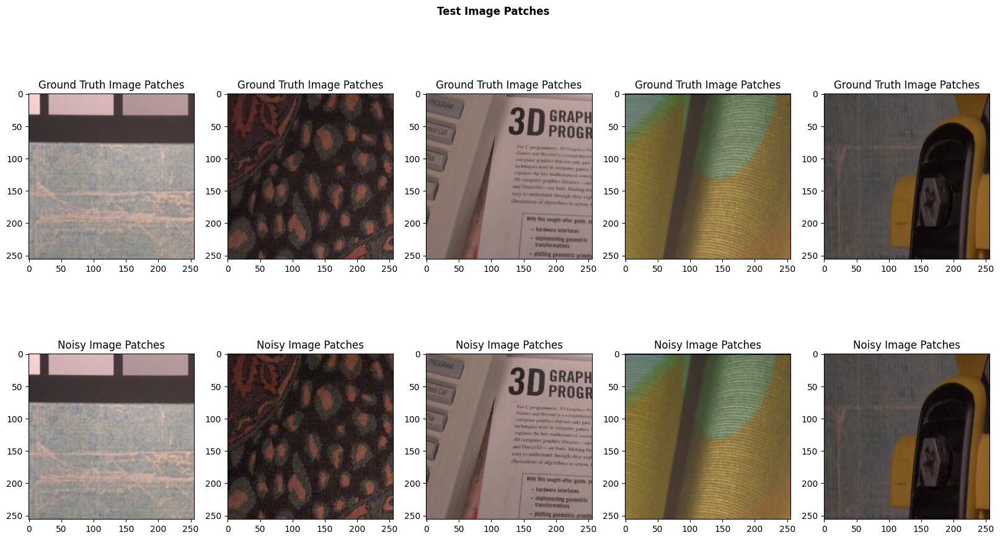

In [19]:
fig, axs = plt.subplots(2,5,figsize=(20,10))
r = random.sample(range(0, 512), 5)

fig.suptitle('Test Image Patches',fontweight ="bold")
for i in range(5):
    axs[0][i].imshow(y_test[r[i]])
    axs[0][i].set_title('Ground Truth Image Patches')
    axs[1][i].imshow(X_test[r[i]])
    axs[1][i].set_title('Noisy Image Patches')

In [19]:
print("Total number of image patches on train data : ", len(X_train))
print("Total number of image patches on test data : ", len(X_test))

Total number of image patches on train data :  2048
Total number of image patches on test data :  512


In [20]:
pickle.dump((X_train,y_train),open('train_data.pkl','wb'))
pickle.dump((X_test,y_test),open('test_data.pkl','wb'))

# Denoising few image patches using NLM filter

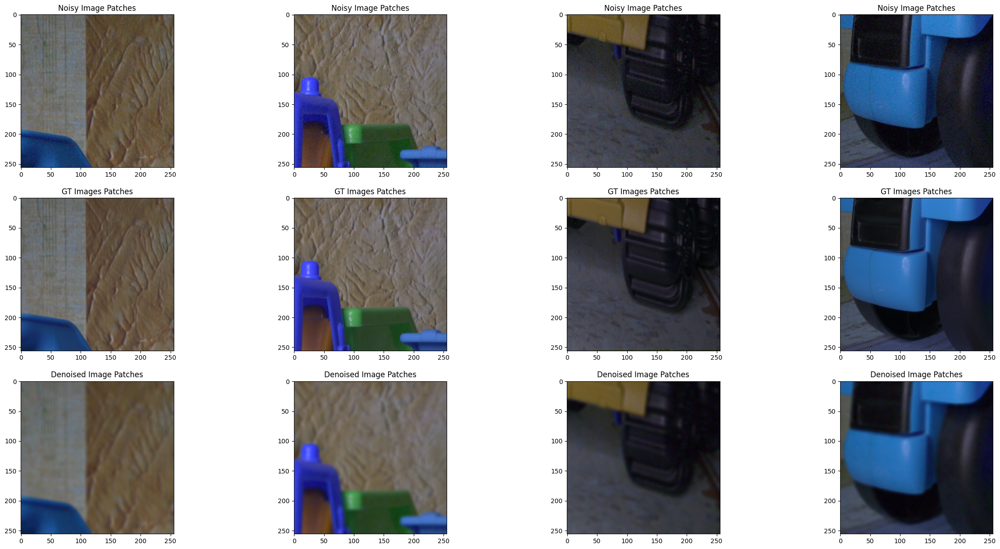

In [24]:
fig, axis = plt.subplots(3, 4, figsize=(30, 15))
r = random.sample(range(0, rows), 4)
c = random.sample(range(0, cols), 4)
PSNR_nsy = []
PSNR_de_nsy = []

for i in range(4):
    img1 = patches_nsy[r[i]][c[i]][0]
    img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)
    img2 = patches_gt[r[i]][c[i]][0]
    img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)

    axis[0][i].imshow(img1)
    axis[0][i].set_title('Noisy Image Patches')
    axis[1][i].imshow(img2)
    axis[1][i].set_title('GT Images Patches')

    # Denoising
    dst = cv2.fastNlMeansDenoisingColored(img1, None, 50, 10, 21, 7)
    axis[2][i].imshow(dst)
    axis[2][i].set_title('Denoised Image Patches')

    PSNR_nsy.append(psnr(img1, img2))
    PSNR_de_nsy.append(psnr(img1, dst))

In [25]:
improvement = [x1 - x2 for(x1, x2) in zip(PSNR_de_nsy, PSNR_nsy)]

In [26]:
from prettytable import PrettyTable
x = PrettyTable()
x.add_column("PSNR before denoising", PSNR_nsy)
x.add_column("PSNR after denoising", PSNR_de_nsy)
x.add_column("PSNR Improvement", improvement)
print(x)

+-----------------------+----------------------+---------------------+
| PSNR before denoising | PSNR after denoising |   PSNR Improvement  |
+-----------------------+----------------------+---------------------+
|   29.263241855211056  |  28.12202666171457   | -1.1412151934964854 |
|   29.73174827919125   |  27.55819590439181   |  -2.173552374799442 |
|    28.4094196791378   |  29.36820505526697   |  0.9587853761291676 |
|   28.503923423453784  |  28.830124930609813  | 0.32620150715602847 |
+-----------------------+----------------------+---------------------+


# Creating Dataset for modeling using custom data generators in Keras

In [2]:
X_train_patches, y_train_patches = pickle.load(open('train_data.pkl', 'rb'))
X_test_patches,y_test_patches = pickle.load(open('test_data.pkl', 'rb'))

In [3]:
print(X_train_patches.shape)
print(y_train_patches.shape)
print(X_test_patches.shape)
print(y_test_patches.shape)

(2048, 256, 256, 3)
(2048, 256, 256, 3)
(512, 256, 256, 3)
(512, 256, 256, 3)


In [4]:
# Normalizing the image pixels
X_train_patches = X_train_patches.astype('float32') / 255.0
y_train_patches = y_train_patches.astype('float32') / 255.0
X_test_patches = X_train_patches.astype('float32') / 255.0
y_test_patches = y_test_patches.astype('float32') / 255.0

In [5]:
from data_loader import Dataloader

batch_size = 32
train_dataloader = Dataloader(X_train_patches,y_train_patches, batch_size, shuffle=True)
test_dataloader = Dataloader(X_test_patches,y_test_patches,batch_size, shuffle=True)

In [6]:
train_dataloader[0][0].shape

(32, 256, 256, 3)

# Baseline Model: Autoencoder

In [7]:
from tensorflow.keras.callbacks import LearningRateScheduler,ReduceLROnPlateau
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, Conv2DTranspose, BatchNormalization, Activation, Flatten, Dense, Input, MaxPooling2D, Add, Reshape, concatenate, AveragePooling2D, Multiply, GlobalAveragePooling2D, UpSampling2D, MaxPool2D,Softmax
from tensorflow.keras.activations import softmax
from tensorflow.keras import initializers, regularizers
from tensorflow.keras.optimizers import Adam

In [10]:
tf.keras.backend.clear_session()

input = Input(shape=(256, 256, 3))

# Encoder
x = Conv2D(32, (3, 3), activation="relu", kernel_initializer="he_normal", padding="same")(input)
x = MaxPooling2D((2, 2), padding="same")(x)
x = Conv2D(64, (3, 3), activation="relu", kernel_initializer="he_normal", padding="same")(x)
x = MaxPooling2D((2, 2), padding="same")(x)
x = Conv2D(128, (3, 3), activation="relu", kernel_initializer="he_normal", padding="same")(x)
x = MaxPooling2D((2, 2), padding="same")(x)

# Decoder
x = Conv2DTranspose(128, (3, 3), strides=2, activation="relu", kernel_initializer="he_normal", padding="same")(x)
x = Conv2DTranspose(64, (3, 3), strides=2, activation="relu", kernel_initializer="he_normal", padding="same")(x)
x = Conv2DTranspose(32, (3, 3), strides=2, activation="relu", kernel_initializer="he_normal", padding="same")(x)
x = Conv2D(3, (3, 3), activation="sigmoid", kernel_initializer="he_normal", padding="same")(x)

# Autoencoder
autoencoder = Model(input, x)
autoencoder.compile(optimizer=tf.keras.optimizers.Adam(1e-03), loss=tf.keras.losses.MeanSquaredError())
autoencoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 32)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 64, 64, 64)        0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       73856 

In [11]:
log_dir = 'logs/model_1'
tensorboard = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1, write_graph=True, write_grads=True)
reducelr = ReduceLROnPlateau(monitor='val_loss', factor=0.1, verbose=1, patience=2)
callback = [tensorboard, reducelr]

autoencoder.fit(train_dataloader, shuffle=True, epochs=15, validation_data=test_dataloader, callbacks=callback)

Epoch 1/15
 729/2048 [=========>....................] - ETA: 3:27 - loss: 0.0848

KeyboardInterrupt: 